# Tiny Shakespeare Dataset

https://raw.githubusercontent.com/karpathy/char-rnn/master/data/tinyshakespeare/input.txt

This dataset is a compact corpus of William Shakespeare's works usefull for debugging LLMs.

In [113]:
%matplotlib inline

In [114]:
import tiktoken
import torch
import re
import matplotlib.pyplot as plt

In [115]:
# We use 'with' to ensure that we open and close the file properly.
with open('../datasets/tinyshakespeare.txt', 'r', encoding='utf-8') as file:
    tiny_shakespeare_corpus = file.read()

Before we do anything let's visualize a small portion of the dataset:

In [116]:
data = tiny_shakespeare_corpus[:1000]
data[:250].splitlines()

['First Citizen:',
 'Before we proceed any further, hear me speak.',
 '',
 'All:',
 'Speak, speak.',
 '',
 'First Citizen:',
 'You are all resolved rather to die than to famish?',
 '',
 'All:',
 'Resolved. resolved.',
 '',
 'First Citizen:',
 'First, you know Caius Marcius is chief enemy to the people.']

# Let's build our vocabulary

In [117]:
chars = sorted(list(set(tiny_shakespeare_corpus)))
vocabulary_size = len(chars)

print('vocab:', ''.join([char if char != '\n' else '\\n' for char in chars]))
print('vocab size:', vocabulary_size)

vocab: \n !$&',-.3:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz
vocab size: 65


# Probability distribution
Let's create a probability distribution for the chars in the vocabulary

In [118]:
shakespeare_words = [word.lower() for word in re.findall(r'\b\w+\b', tiny_shakespeare_corpus)]
shakespeare_words

['first',
 'citizen',
 'before',
 'we',
 'proceed',
 'any',
 'further',
 'hear',
 'me',
 'speak',
 'all',
 'speak',
 'speak',
 'first',
 'citizen',
 'you',
 'are',
 'all',
 'resolved',
 'rather',
 'to',
 'die',
 'than',
 'to',
 'famish',
 'all',
 'resolved',
 'resolved',
 'first',
 'citizen',
 'first',
 'you',
 'know',
 'caius',
 'marcius',
 'is',
 'chief',
 'enemy',
 'to',
 'the',
 'people',
 'all',
 'we',
 'know',
 't',
 'we',
 'know',
 't',
 'first',
 'citizen',
 'let',
 'us',
 'kill',
 'him',
 'and',
 'we',
 'll',
 'have',
 'corn',
 'at',
 'our',
 'own',
 'price',
 'is',
 't',
 'a',
 'verdict',
 'all',
 'no',
 'more',
 'talking',
 'on',
 't',
 'let',
 'it',
 'be',
 'done',
 'away',
 'away',
 'second',
 'citizen',
 'one',
 'word',
 'good',
 'citizens',
 'first',
 'citizen',
 'we',
 'are',
 'accounted',
 'poor',
 'citizens',
 'the',
 'patricians',
 'good',
 'what',
 'authority',
 'surfeits',
 'on',
 'would',
 'relieve',
 'us',
 'if',
 'they',
 'would',
 'yield',
 'us',
 'but',
 'the'

In [119]:
chars = sorted(list(set(''.join(shakespeare_words))))
stoi = {s:i+1 for i,s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s,i in stoi.items()}

In [120]:
N = torch.zeros((28, 28), dtype=torch.int32)

In [121]:
for w in shakespeare_words:
  chs = ['.'] + list(w) + ['.']
  for ch1, ch2 in zip(chs, chs[1:]):
    print(ch1, ch2)

    ix1 = stoi[ch1]
    ix2 = stoi[ch2]

    N[ix1, ix2] += 1


. f
f i
i r
r s
s t
t .
. c
c i
i t
t i
i z
z e
e n
n .
. b
b e
e f
f o
o r
r e
e .
. w
w e
e .
. p
p r
r o
o c
c e
e e
e d
d .
. a
a n
n y
y .
. f
f u
u r
r t
t h
h e
e r
r .
. h
h e
e a
a r
r .
. m
m e
e .
. s
s p
p e
e a
a k
k .
. a
a l
l l
l .
. s
s p
p e
e a
a k
k .
. s
s p
p e
e a
a k
k .
. f
f i
i r
r s
s t
t .
. c
c i
i t
t i
i z
z e
e n
n .
. y
y o
o u
u .
. a
a r
r e
e .
. a
a l
l l
l .
. r
r e
e s
s o
o l
l v
v e
e d
d .
. r
r a
a t
t h
h e
e r
r .
. t
t o
o .
. d
d i
i e
e .
. t
t h
h a
a n
n .
. t
t o
o .
. f
f a
a m
m i
i s
s h
h .
. a
a l
l l
l .
. r
r e
e s
s o
o l
l v
v e
e d
d .
. r
r e
e s
s o
o l
l v
v e
e d
d .
. f
f i
i r
r s
s t
t .
. c
c i
i t
t i
i z
z e
e n
n .
. f
f i
i r
r s
s t
t .
. y
y o
o u
u .
. k
k n
n o
o w
w .
. c
c a
a i
i u
u s
s .
. m
m a
a r
r c
c i
i u
u s
s .
. i
i s
s .
. c
c h
h i
i e
e f
f .
. e
e n
n e
e m
m y
y .
. t
t o
o .
. t
t h
h e
e .
. p
p e
e o
o p
p l
l e
e .
. a
a l
l l
l .
. w
w e
e .
. k
k n
n o
o w
w .
. t
t .
. w
w e
e .
. k


In [122]:
N

tensor([[    0,    27, 18011, 10866,  7439,  8043,  3485,  8138,  5030, 14214,
         13879,   707,  2418,  7349, 13001,  6440,  9067,  5927,   628,  3624,
         16822, 29548,  2129,  1488, 13963,    22,  6249,    16],
        [   27,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0],
        [ 4132,     0,     0,   887,  1623,  2305,    40,   370,  1041,   109,
          2327,    57,  1577,  4513,  1998, 12988,    18,   908,     3,  8311,
          4427,  8547,  1169,  2475,   624,    25,  2778,    74],
        [  131,     0,  1065,    62,     0,    11,  4680,     0,     0,    31,
           546,    72,     0,  1314,     6,     2,  1336,     0,     0,  1445,
           132,   100,  2122,     0,     1,     0,  1026,     0],
        [  109,     0,  2229,     0,   216,     0,  4034,     0,     0,  3703,
          1057,     0,  1

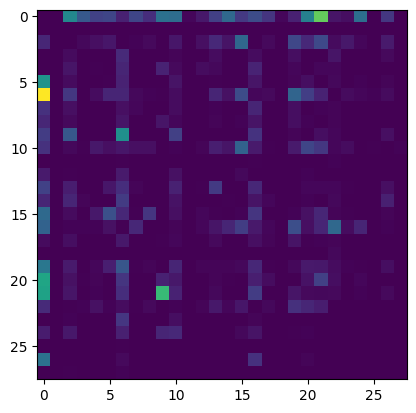

In [123]:
plt.imshow(N)

(np.float64(-0.5), np.float64(27.5), np.float64(27.5), np.float64(-0.5))

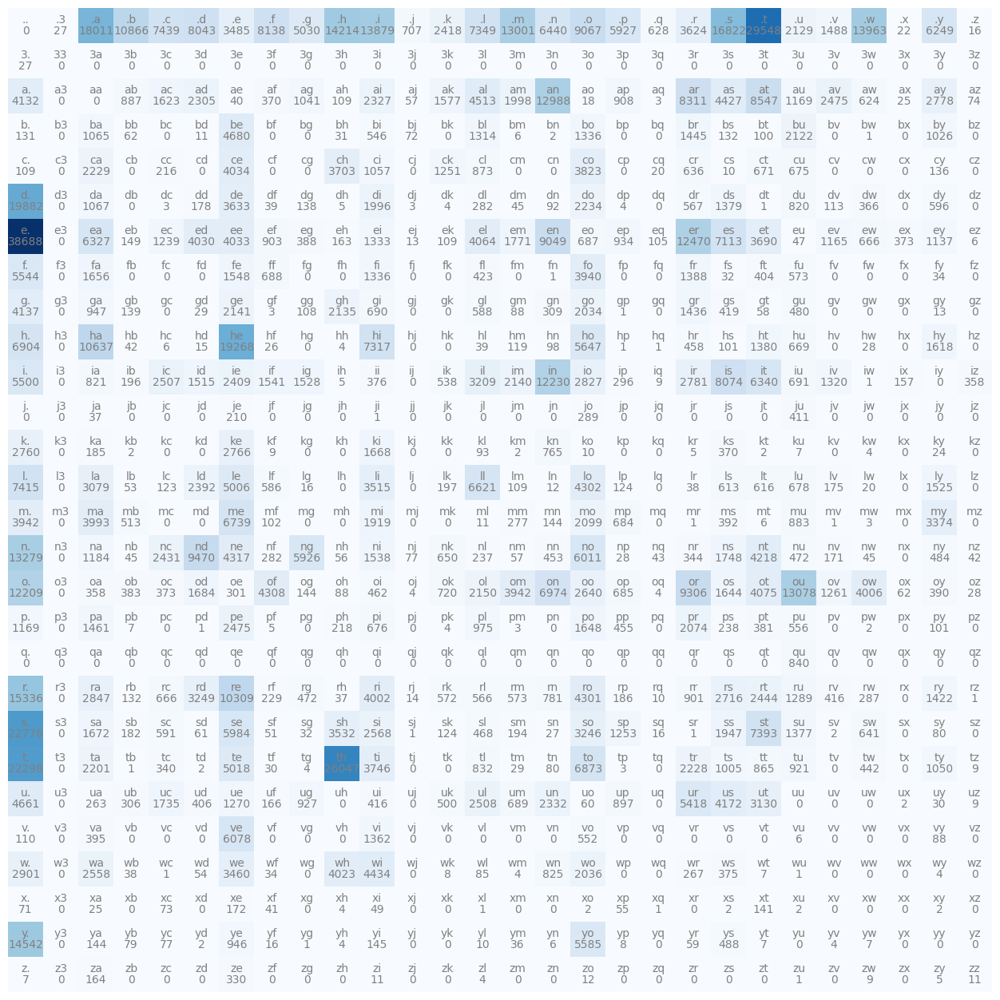

In [124]:
plt.figure(figsize=(16,16))
plt.imshow(N, cmap='Blues')

for i in range(28):
    for j in range(28):
        chstr = itos[i] + itos[j]

        plt.text(j, i, chstr, ha="center", va="bottom", color='gray')
        plt.text(j, i, N[i, j].item(), ha="center", va="top", color='gray')

plt.axis('off')